# Stable Diffusion with 🤗 Diffusers

This notebook is a modified version of the original work done by
**Pedro Cuenca, Patrick von Platen, Suraj Patil, Jeremy Howard**

Chances are you'll have seen examples in Twitter (and elsewhere) of images generated by typing a short description of the scene you want to create. This is the culmination of years of work in generative models. This notebook introduces Stable Diffusion, the highest-quality open source text to image model as of now. It's also small enough to run in consumer GPUs rather than in a datacenter. We use the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers), which is currently our recommended library for using diffusion models.

As we'll see during the course, understanding state-of-the-art generative models requires a deep understanding of many of the fundamental blocks in modern machine learning models. This notebook shows what Stable Diffusion can do and a glimpse of its main components.

_If you open this notebook in Colab, or if you get type errors when generating your first image, please uncomment and run the following cell._

In [ ]:
!pip install -Uq diffusers transformers fastcore

In [ ]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful


### Stable Diffusion Pipeline

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [ ]:
!ls ~/.cache/huggingface/diffusers/

ls: cannot access '/root/.cache/huggingface/diffusers/': No such file or directory


In [ ]:
pipe.enable_attention_slicing()

In [ ]:
prompt = "professional pencil sketch of a bridge, a hill, birds and the sun"

  0%|          | 0/50 [00:00<?, ?it/s]

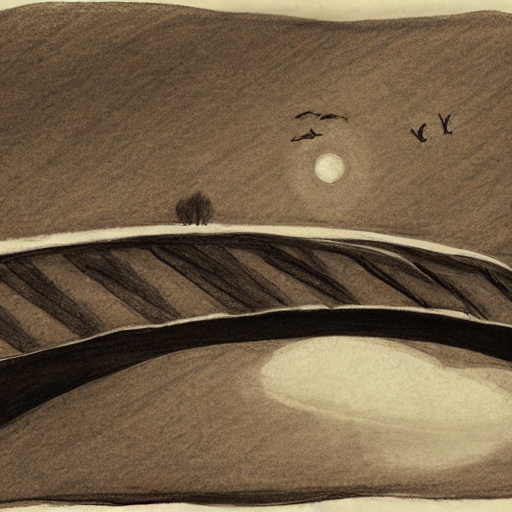

In [ ]:
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

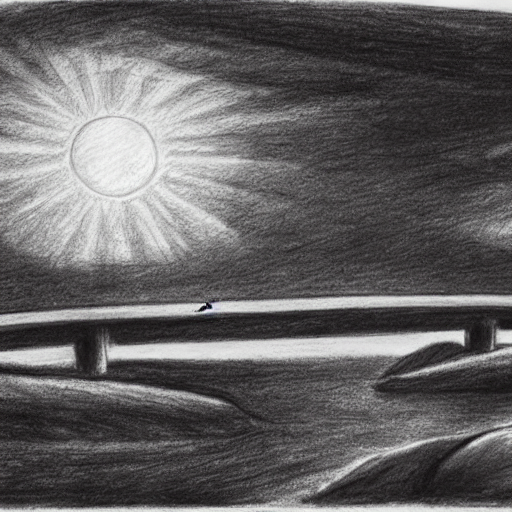

In [ ]:
torch.manual_seed(1000)
pipe(prompt).images[0]

![image.png](attachment:image.png)

  0%|          | 0/16 [00:00<?, ?it/s]

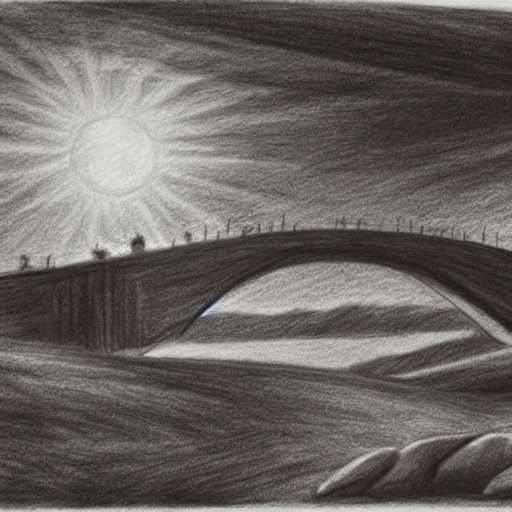

In [ ]:
torch.manual_seed(1000)
pipe(prompt, num_inference_steps=16).images[0]

### Classifier-Free Guidance

In [ ]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

_Classifier-Free Guidance_ is a method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is `7.5`, which represents a good compromise between variety and fidelity. This [blog post](https://benanne.github.io/2022/05/26/guidance.html) goes into deeper details on how it works.

We can generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

In [ ]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [ ]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.9,2.5,3.1,6.9])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

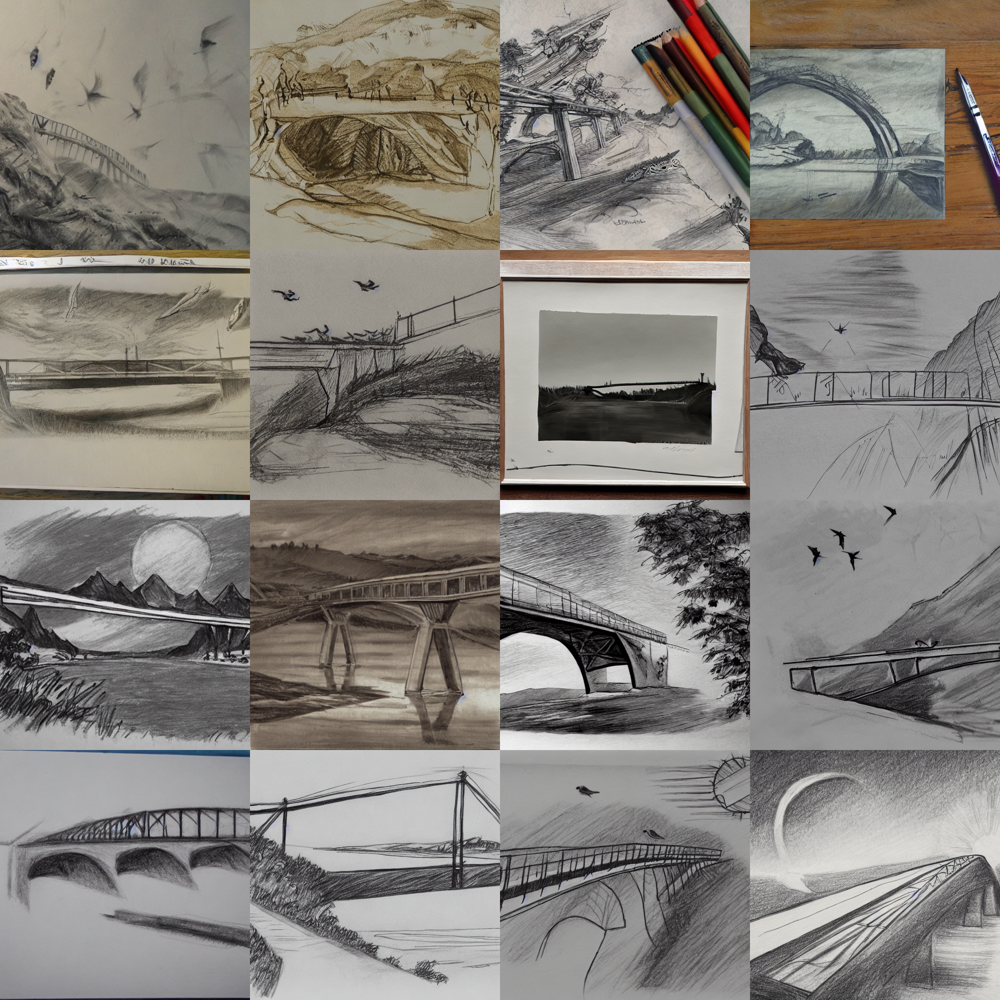

In [ ]:
image_grid(images, rows=num_rows, cols=num_cols)

  0%|          | 0/50 [00:00<?, ?it/s]

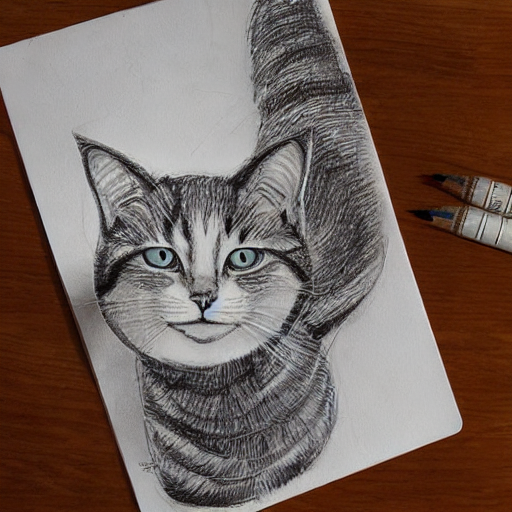

In [ ]:
torch.manual_seed(1000)
prompt = "professional pencil sketch of a christmas tree and a cat style of Adonna Khare"
pipe(prompt).images[0]

Negative prompt

  0%|          | 0/50 [00:00<?, ?it/s]

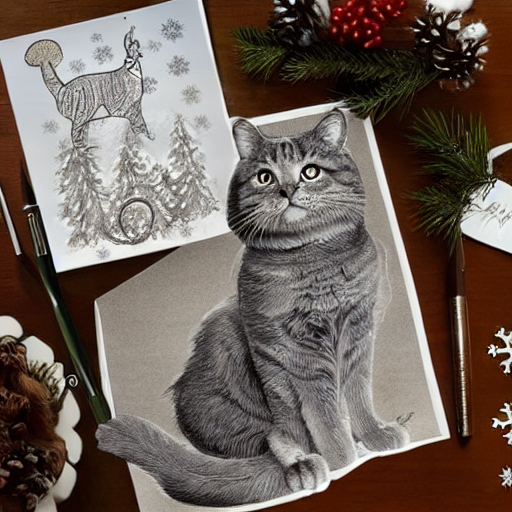

In [ ]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="pencil").images[0]

### Image to Image

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16,
).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


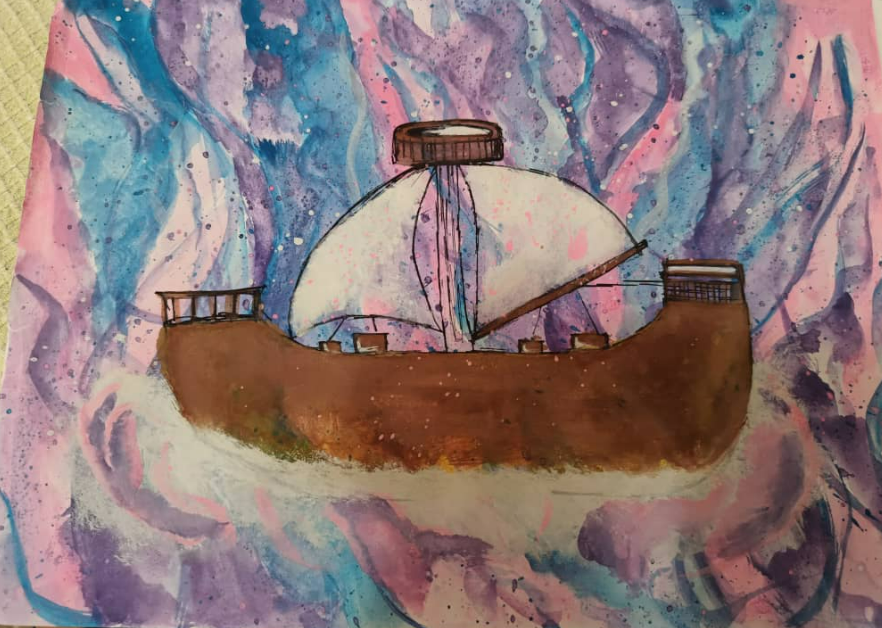

In [ ]:
# p = FastDownload().download('https://storage.googleapis.com/fastaitest/test5.png')
#add image to root folder and the write the path
init_image = Image.open('/root/test5.png').convert("RGB")
init_image

  0%|          | 0/85 [00:00<?, ?it/s]

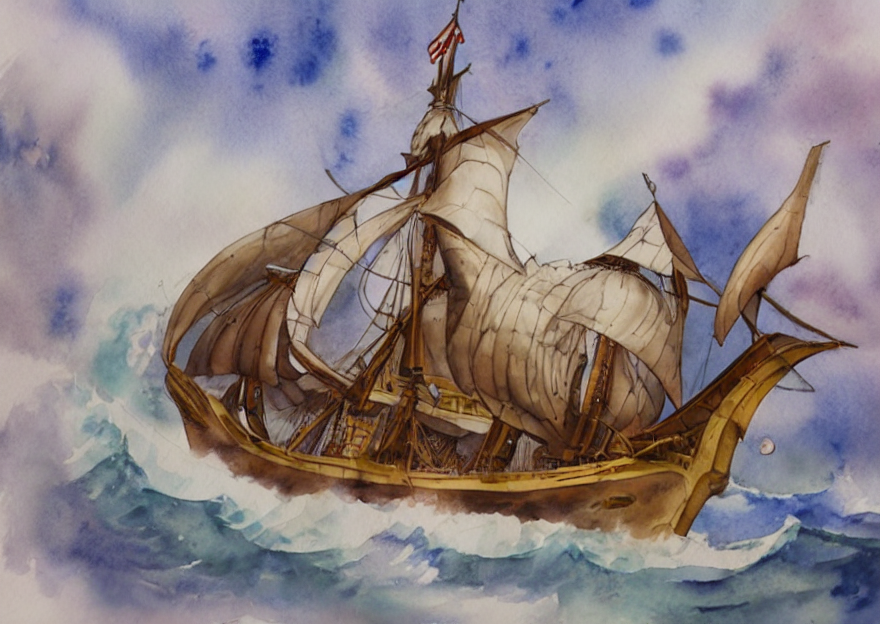

In [ ]:
torch.manual_seed(1000)
prompt = "professional watercolor painting of a Galleon sealing in the milkyway"
images = pipe(prompt=prompt, num_images_per_prompt=1, image=init_image, strength=0.85, num_inference_steps=100).images
image_grid(images, rows=1, cols=1)

When we get a composition we like we can use it as the next seed for another prompt and further change the results. For example, let's take the third image above and try to use it to generate something in the style of Van Gogh.

In [ ]:
init_image = images[5]

In [ ]:
init_image

In [ ]:
torch.manual_seed(1000)
prompt = "Oil painting of a bridge, a hill, bids and the sun style by Van Gogh"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)